In [1]:
import pandas as pd
import geopandas as gpd
import glob
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
import numpy as np
from scipy import stats
from scipy.stats import pearsonr
import math 
import haversine as hs
import plotly.express as px

from utils.util_functions import *

%load_ext autoreload
%autoreload 2

/Users/juanolmos/opt/anaconda3/envs/dl/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.3-CAPI-1.16.1). Conversions between both will be slow.
  warnings.warn(


In [2]:
# !pip install haversine

In [3]:
festivos2022 = ["2021-12-31","2022-01-01", "2022-01-10", "2022-03-21", "2022-04-14", "2022-04-15"]    

name = dict({"Bolivar_Valledupar": "Bolivar - Valledupar",
             "Briceno_Tunja_Sogamoso": "Briceño - Tunja - Sogamoso",
             "Cienaga_San_Roque": "Cienaga - San Roque"})

In [4]:
geodf_buffer = gpd.GeoDataFrame.from_file("../../../shared_speeds_wbg/buffer_without_overlaps/buffer_without_overlaps.shp")

In [ ]:
for i, path_df in enumerate(sorted(glob.glob("../../outlogic_allcorridors/2022*.csv"))):               
    df = get_df_in_buffer(path_df = path_df, geodf_buffer = geodf_buffer)    

    df = df[df["Road_right"].notna()] #datos en los cuales hay interseccion y quedan con esta caracteristica vacia
    df = df[~df["local_location_at"].str.contains("|".join(festivos2022))] #Quitando festivos
    df = df[df["horizontal_accuracy"] < 10]
    
    if i > 0:
        df = pd.concat([df,df_ant])
        df_ant = df
    else:
        df_ant = df
    
df.loc[:,'local_location_at'] = df['local_location_at'].apply(lambda x: x[:-4])    

In [207]:
# df.to_csv("data/outlogic2022_ha10_nf.csv", index = False)

In [22]:
df = pd.read_csv("data/outlogic2022_ha10_nf.csv")

/Users/juanolmos/opt/anaconda3/envs/dl/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning:

Columns (29) have mixed types.Specify dtype option on import or set low_memory=False.



In [23]:
len(df)

1346372

In [24]:
len(df["device_id"].unique())

13998

In [25]:
# print(df.columns)

In [26]:
df.loc[:,'date_1']=df['local_location_at'].apply(lambda x: datetime.strptime(x,'%Y-%m-%d %H:%M:%S')) #convert str to timestamp
df['date_2h'] = df['date_1'].apply(lambda dt: datetime(dt.year, dt.month, dt.day, 2*(dt.hour // 2)))
df['date_3h'] = df['date_1'].apply(lambda dt: datetime(dt.year, dt.month, dt.day, 3*(dt.hour // 3)))
df['date_6h'] = df['date_1'].apply(lambda dt: datetime(dt.year, dt.month, dt.day, 6*(dt.hour // 6)))
df['date_30min'] = df['date_1'].apply(lambda dt: datetime(dt.year, dt.month, dt.day, dt.hour, 30*(dt.minute // 30)))
df['date_day'] = df['date_1'].apply(lambda dt: datetime(dt.year, dt.month, dt.day))

columna_filtrar_tiempos = "date_3h"
df["hourTimeStamp"] = df[columna_filtrar_tiempos].dt.hour
df["dayTimeStamp"] = df[columna_filtrar_tiempos].dt.day

df = df[(df["hourTimeStamp"] > 3) & (df["hourTimeStamp"] < 21)] 
df

,Unnamed: 0,Unnamed: 0.1,device_id,platform,timestamp,local_location_at,latitude,longitude,iso_region,horizontal_accuracy,...,Area,location_dt,date_1,date_2h,date_3h,date_6h,date_30min,date_day,hourTimeStamp,dayTimeStamp
0,104,759,d581a938c7c2b0b201d6d5cc2b5775adc6f22265e1826b...,AAID,2022-04-21 12:54:01+00:00,2022-04-21 07:54:01,5.765943,-72.971240,CO-BOY,1.4,...,37469.780716,NaN,2022-04-21 07:54:01,2022-04-21 06:00:00,2022-04-21 06:00:00,2022-04-21 06:00:00,2022-04-21 07:30:00,2022-04-21,6,21
1,43545,4991,b12fe89c72dd75edc71cf448683103a077ef24026648bb...,AAID,2022-04-21 23:53:55+00:00,2022-04-21 18:53:55,5.756564,-72.967430,CO-BOY,5.7,...,37469.780716,NaN,2022-04-21 18:53:55,2022-04-21 18:00:00,2022-04-21 18:00:00,2022-04-21 18:00:00,2022-04-21 18:30:00,2022-04-21,18,21
2,45689,10019,418a934d5f49cd24052757575f540610cd316e39bfd710...,IDFA,2022-04-21 21:59:45+00:00,2022-04-21 16:59:45,5.767820,-72.972010,CO-BOY,4.7,...,37469.780716,NaN,2022-04-21 16:59:45,2022-04-21 16:00:00,2022-04-21 15:00:00,2022-04-21 12:00:00,2022-04-21 16:30:00,2022-04-21,15,21
3,120887,6885,8656073075e8ff9cc53459694fdd7c5fb54074bdcf1864...,AAID,2022-04-21 21:17:08+00:00,2022-04-21 16:17:08,5.762593,-72.969930,CO-BOY,1.9,...,37469.780716,NaN,2022-04-21 16:17:08,2022-04-21 16:00:00,2022-04-21 15:00:00,2022-04-21 12:00:00,2022-04-21 16:00:00,2022-04-21,15,21
4,135658,6209,1b82761fe0aeb548f1643cc57a3f0ba81917f881488f5d...,AAID,2022-04-21 12:29:08+00:00,2022-04-21 07:29:08,5.751986,-72.962540,CO-BOY,1.5,...,37469.780716,NaN,2022-04-21 07:29:08,2022-04-21 06:00:00,2022-04-21 06:00:00,2022-04-21 06:00:00,2022-04-21 07:00:00,2022-04-21,6,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346367,1257412,2230,f7cca1c4d8d071e7f53f3c24a17328a886c5c9e5ef5541...,AAID,2022-01-02 19:20:59+00:00,2022-01-02 14:20:59,9.393563,-73.539290,CO-CES,9.9,...,39490.927703,2022-01-02,2022-01-02 14:20:59,2022-01-02 14:00:00,2022-01-02 12:00:00,2022-01-02 12:00:00,2022-01-02 14:00:00,2022-01-02,12,2
1346368,1339771,881,f7cca1c4d8d071e7f53f3c24a17328a886c5c9e5ef5541...,AAID,2022-01-02 19:21:46+00:00,2022-01-02 14:21:46,9.384047,-73.536480,CO-CES,9.9,...,39490.927703,2022-01-02,2022-01-02 14:21:46,2022-01-02 14:00:00,2022-01-02 12:00:00,2022-01-02 12:00:00,2022-01-02 14:00:00,2022-01-02,12,2
1346369,1222344,1884,752972f0e240d8c8af1eda7c31415f7a23b6b0692e849a...,AAID,2022-01-02 20:26:27+00:00,2022-01-02 15:26:27,10.083408,-73.732540,CO-CES,4.0,...,5911.769890,2022-01-02,2022-01-02 15:26:27,2022-01-02 14:00:00,2022-01-02 15:00:00,2022-01-02 12:00:00,2022-01-02 15:00:00,2022-01-02,15,2
1346370,1326618,2118,e2ae6e4f8d11dd2b378e53a95d3c44533cdac232498c5c...,AAID,2022-01-02 16:16:46+00:00,2022-01-02 11:16:46,9.867915,-74.563240,CO-MAG,3.8,...,19540.767922,2022-01-02,2022-01-02 11:16:46,2022-01-02 10:00:00,2022-01-02 09:00:00,2022-01-02 06:00:00,2022-01-02 11:00:00,2022-01-02,9,2


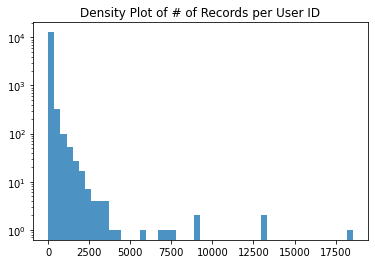

In [9]:
# Contando cantidad de datos por usuario
counts = df['device_id'].value_counts().rename_axis('unique_values').reset_index(name='counts')

plt.hist(counts['counts'],bins=50,alpha=0.8)  
plt.title("Density Plot of # of Records per User ID")
# plt.xscale('log')
plt.yscale('log')
plt.show()



Len df_analysis: 93979


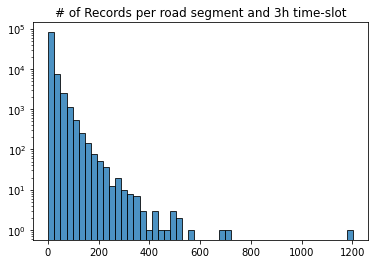

In [10]:
# Analisis de datos por segmento por 3h rango diario
df_analysis = df.groupby(["ID_1","date_3h"]).size().reset_index()
df_analysis.columns = ["ID_1","date_3h","counts"]

print(f"Len df_analysis: {len(df_analysis)}")
plt.hist(df_analysis['counts'],bins=50,alpha=0.8, edgecolor = "black")  
plt.title("# of Records per road segment and 3h time-slot")
# plt.xscale('log')
plt.yscale('log')

# plt.savefig("outputs/2022_11_informe/numRecords_perSegment_and3HtimeSlot.png", dpi=200, bbox_inches="tight")
plt.show()


In [27]:
RANGO = "date_3h"
# RANGO = "date_30min"
idx_max = df.groupby(["Road_right","ID_1","device_id",RANGO])['date_1'].transform(max) == df['date_1']
idx_min = df.groupby(["Road_right","ID_1","device_id",RANGO])['date_1'].transform(min) == df['date_1']

df_max = df[idx_max][["Road_right","ID_1","device_id","latitude","longitude","date_1",RANGO,"date_day"]]
df_min = df[idx_min][["Road_right","ID_1","device_id","latitude","longitude","date_1",RANGO,"date_day"]]

df_test = pd.merge(df_max, df_min, on = ["Road_right","ID_1","device_id",RANGO,"date_day"], suffixes = ("_max","_min"))

df_test["hourTimeStamp"] = df_test[RANGO].dt.hour
df_test["t"] = (df_test["date_1_max"] - df_test["date_1_min"]).dt.total_seconds()
# print(len(df_test))
df_test = df_test[df_test["t"] > 0]
# print(len(df_test))

df_test["distance"] = df_test.apply(lambda x: hs.haversine((x.latitude_min, x.longitude_min), (x.latitude_max, x.longitude_max)), axis = 1)
df_test["vel"] = 3600 * (df_test["distance"] / df_test["t"])
df_test = df_test[(df_test["vel"]>15) & (df_test["vel"]<150)]
df_test



,Road_right,ID_1,device_id,latitude_max,longitude_max,date_1_max,date_3h,date_day,latitude_min,longitude_min,date_1_min,hourTimeStamp,t,distance,vel
0,Briceno_Tunja_Sogamoso,196,d581a938c7c2b0b201d6d5cc2b5775adc6f22265e1826b...,5.765943,-72.971240,2022-04-21 07:54:01,2022-04-21 06:00:00,2022-04-21,5.750700,-72.959670,2022-04-21 07:51:36,6,145.0,2.123990,52.733548
2,Briceno_Tunja_Sogamoso,196,418a934d5f49cd24052757575f540610cd316e39bfd710...,5.767820,-72.972010,2022-04-21 16:59:45,2022-04-21 15:00:00,2022-04-21,5.749278,-72.948230,2022-04-21 16:55:15,15,270.0,3.342520,44.566928
3,Briceno_Tunja_Sogamoso,196,1b82761fe0aeb548f1643cc57a3f0ba81917f881488f5d...,5.751986,-72.962540,2022-04-21 07:29:08,2022-04-21 06:00:00,2022-04-21,5.765216,-72.970950,2022-04-21 07:27:16,6,112.0,1.740652,55.949533
4,Briceno_Tunja_Sogamoso,196,f1deb0741ed2d53cf0b6c9b4fb7e734dba178909967f79...,5.751913,-72.962430,2022-04-21 08:50:52,2022-04-21 06:00:00,2022-04-21,5.763463,-72.970280,2022-04-21 08:49:42,6,70.0,1.550383,79.733996
5,Briceno_Tunja_Sogamoso,196,70744ebafee69489dd77287a0a2191a7cc5f6529990602...,5.763770,-72.970360,2022-04-21 15:58:39,2022-04-21 15:00:00,2022-04-21,5.749194,-72.949540,2022-04-21 15:55:49,15,170.0,2.816489,59.643296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
392418,Bolivar_Valledupar,234,640dd9ea9b1bdd9381b789bb34830345046af617fff5f5...,10.262405,-73.427320,2022-01-02 12:52:19,2022-01-02 12:00:00,2022-01-02,10.255493,-73.435880,2022-01-02 12:50:47,12,92.0,1.211594,47.410192
392419,Bolivar_Valledupar,316,e2ae6e4f8d11dd2b378e53a95d3c44533cdac232498c5c...,9.873467,-74.578000,2022-01-02 11:15:13,2022-01-02 09:00:00,2022-01-02,9.869328,-74.584960,2022-01-02 11:14:27,9,46.0,0.890597,69.698883
392425,Bolivar_Valledupar,288,e2ae6e4f8d11dd2b378e53a95d3c44533cdac232498c5c...,9.852326,-74.625824,2022-01-02 11:10:35,2022-01-02 09:00:00,2022-01-02,9.851469,-74.644936,2022-01-02 11:09:05,9,90.0,2.095989,83.839549
392427,Bolivar_Valledupar,299,752972f0e240d8c8af1eda7c31415f7a23b6b0692e849a...,10.158907,-73.623390,2022-01-02 15:11:45,2022-01-02 15:00:00,2022-01-02,10.168681,-73.609100,2022-01-02 15:09:25,15,140.0,1.904575,48.974798


Len df_test: 185717
Len df_analysis: 60928


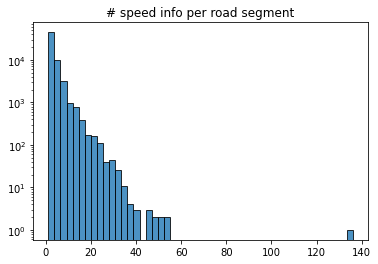

In [12]:
# Contando cantidad de datos por usuario por rango 3h
df_analysis = df_test.groupby(["ID_1","date_3h"]).size().reset_index()
df_analysis.columns = ["ID_1","date_3h","counts"]

print(f"Len df_test: {len(df_test)}")
print(f"Len df_analysis: {len(df_analysis)}")
plt.hist(df_analysis['counts'],bins=50,alpha=0.8, edgecolor = "black")  
plt.title("# speed info per road segment")
# plt.xscale('log')
plt.yscale('log')
plt.show()


In [36]:
# df_t2 = df_analysis[df_analysis["counts"] < 5] #data que queremos quitar de df_test
# df_t3 = df_test.merge(df_t2, on = ["ID_1","date_3h"], how = "outer", indicator = True)
# df_t3 = df_t3.query('_merge != "both"')
# df_t3

In [37]:
# df_test = df_t3.copy()
# print(len(df_test))

,Road_right,ID_1,date_3h,speed,speed_std,count
0,Bolivar_Valledupar,201,2022-01-02 09:00:00,32.635036,NaN,1
1,Bolivar_Valledupar,201,2022-01-03 06:00:00,71.551989,NaN,1
2,Bolivar_Valledupar,201,2022-01-03 12:00:00,65.892899,NaN,1
3,Bolivar_Valledupar,201,2022-01-04 06:00:00,83.449808,NaN,1
4,Bolivar_Valledupar,201,2022-01-04 12:00:00,61.152662,3.113231,2


60928


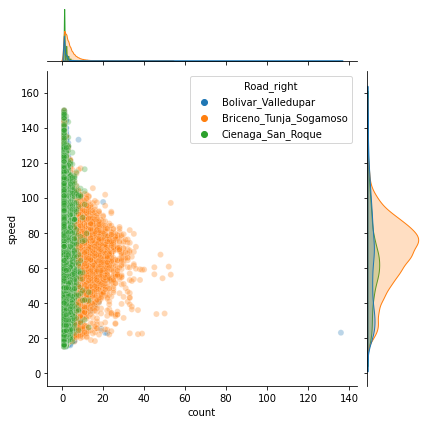

In [28]:
# speed average, and recrods per user in each road 
df_freq_id = df_test.copy()
df_freq_id["count"] = 1

RANGO = "date_3h"

df_freq_id = df_freq_id.groupby(["Road_right","ID_1",RANGO]).agg(
    speed = ("vel",stats.hmean),
    speed_std = ("vel", "std"),
    count = ("count","sum")
    ).reset_index()

# df_freq_id = df_freq_id[(df_freq_id["speed_std"] < 20) & (df_freq_id["speed_std"].notna())]

display(df_freq_id.head())
print(len(df_freq_id))


fig = px.scatter(df_freq_id, x="count", y="speed", color = "Road_right", 
                 hover_data = ["speed_std","ID_1",RANGO], 
                 opacity = 0.3,
                 marginal_y = "histogram",
                 marginal_x = "histogram")
fig.update_layout(
    width = 1000,)
fig.show()


#Plotting records vs speed
g = sns.jointplot(data=df_freq_id, 
                  x="count", 
                  y="speed", 
                  alpha=0.3,
                  color = 'b',
                  hue = "Road_right")
# plt.yscale("log")
# plt.xscale("log")
plt.show()




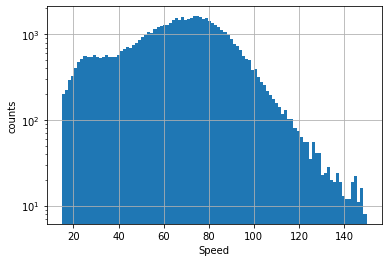

In [29]:
df_freq_id["speed"].hist(bins = 100)
# plt.xscale("log")
plt.yscale("log")
plt.xlabel("Speed")
plt.ylabel("counts")
plt.show()

# Comparison with Mapbox

In [109]:
#Mapbox data
df_dis = get_all_dis()

In [110]:
df_dis.columns

Index(['Unnamed: 0', 'start_x', 'start_y', 'end_x', 'end_y', 'id', 'road',
       'length', 'duration', 'distance', 'timestamp', 'speed', 'time_slot',
       'id_general'],
      dtype='object')

In [111]:
df_dis.loc[:,'date_1']=df_dis['timestamp'].apply(lambda x: datetime.strptime(x,'%Y-%m-%d %H:%M:%S')) #convert str to timestamp
df_dis['date_3h'] = df_dis['date_1'].apply(lambda dt: datetime(dt.year, dt.month, dt.day, 3*(dt.hour // 3)))
df_dis['date_15min'] = df_dis['date_1'].apply(lambda dt: datetime(dt.year, dt.month, dt.day, dt.hour, 15*(dt.minute // 15)))
df_dis["hourTimeStamp"] = df_dis["date_3h"].dt.hour

df_dis.head()

,Unnamed: 0,start_x,start_y,end_x,end_y,id,road,length,duration,distance,timestamp,speed,time_slot,id_general,date_1,date_3h,date_15min,hourTimeStamp
0,0,-74.215090,11.001896,-74.175485,10.962753,1,Cienaga_San_Roque,6171.831,382.730,6191.192,2022-08-12 05:00:00,58.052914,15,1Cienaga_San_Roque,2022-08-12 05:00:00,2022-08-12 03:00:00,2022-08-12 05:00:00,3
1,1,-73.532849,9.370901,-73.523093,9.338208,2,Cienaga_San_Roque,3771.547,298.768,3794.159,2022-08-12 05:00:00,45.445192,15,2Cienaga_San_Roque,2022-08-12 05:00:00,2022-08-12 03:00:00,2022-08-12 05:00:00,3
2,2,-73.559186,9.464616,-73.546034,9.416301,3,Cienaga_San_Roque,5586.658,275.233,5617.587,2022-08-12 05:00:00,73.072520,15,3Cienaga_San_Roque,2022-08-12 05:00:00,2022-08-12 03:00:00,2022-08-12 05:00:00,3
3,3,-73.965240,10.173329,-73.951025,10.144077,4,Cienaga_San_Roque,3607.565,339.088,3627.328,2022-08-12 05:00:00,38.300482,15,4Cienaga_San_Roque,2022-08-12 05:00:00,2022-08-12 03:00:00,2022-08-12 05:00:00,3
4,4,-73.951029,10.144077,-73.937540,10.097131,5,Cienaga_San_Roque,5402.751,290.149,5434.581,2022-08-12 05:00:01,67.034191,15,5Cienaga_San_Roque,2022-08-12 05:00:01,2022-08-12 03:00:00,2022-08-12 05:00:00,3


In [112]:
df_dis = df_dis.groupby(["id","hourTimeStamp"]).agg(
    speed = ("speed","mean"),
    # speed = ("speed", percentile(85)),
    speed_std = ("speed","std")).reset_index()

df_dis = df_dis[(df_dis["speed"].notna()) & (df_dis["speed"] < 150) & (df_dis["speed"] >15)] 
   
# MERGE INDICES DISAGGREGATED-V2V3
df_v2v3 = pd.read_csv("../../idv2_idv3.csv") # id_2 Road_2 son las columnas de los segmentos que estamos analizando
df_dis = df_dis.merge(df_v2v3, left_on = "id", right_on = "id")[["id_2","hourTimeStamp","speed","speed_std"]]
df_dis["id_2"] = df_dis["id_2"].astype(str)


df_dis.sort_values(by = ["id_2","hourTimeStamp"], inplace = True)
df_dis


,id_2,hourTimeStamp,speed,speed_std
0,1,3,44.588563,14.827416
3,1,6,44.208292,14.106949
6,1,9,43.949220,15.072246
9,1,12,44.215723,14.904510
12,1,15,45.565076,14.478785
...,...,...,...,...
2062,99,9,57.793720,26.713900
2064,99,12,58.964671,26.700878
2066,99,15,59.394295,26.733640
2068,99,18,59.930046,27.478427


In [113]:
RANGO = "date_3h"

df_mean_speeds_id = df_test.groupby(["Road_right","device_id","ID_1",RANGO,"hourTimeStamp"]).agg(
    speed = ("vel","mean"),
    # speed = ("vel",percentile(85)),
    speed_std = ("vel","std")).reset_index()

df_mean_speeds_id = df_mean_speeds_id.groupby(["Road_right","ID_1",RANGO,"hourTimeStamp"]).agg(
    speed = ("speed","mean"),
    # speed = ("speed",percentile(85)),
    speed_std = ("speed","std")).reset_index()

df_mean_speeds_id = df_mean_speeds_id.groupby(["Road_right","ID_1","hourTimeStamp"]).agg(
    speed = ("speed",stats.hmean),
    speed_std = ("speed_std","mean")).reset_index()

df_mean_speeds_id.sort_values(by = ["ID_1","hourTimeStamp"], inplace = True)
df_mean_speeds_id

,Road_right,ID_1,hourTimeStamp,speed,speed_std
1086,Cienaga_San_Roque,1,6,58.463241,8.909954
1087,Cienaga_San_Roque,1,9,61.379255,10.130851
1088,Cienaga_San_Roque,1,12,54.134863,8.855547
1089,Cienaga_San_Roque,1,15,54.089738,9.385855
1090,Cienaga_San_Roque,1,18,55.057788,11.747754
...,...,...,...,...,...
591,Bolivar_Valledupar,336,6,57.683650,21.532183
592,Bolivar_Valledupar,336,9,68.016219,7.993487
593,Bolivar_Valledupar,336,12,57.780066,12.758085
594,Bolivar_Valledupar,336,15,63.729888,11.737452


In [58]:
# df_mean_speeds_id.to_csv("outputs/lotlan_road_hmean_nostd20.csv", index = False)

In [59]:
# df_mean_speeds_id = pd.read_csv("outputs/lotlan_road_hmean_std20dataday.csv")

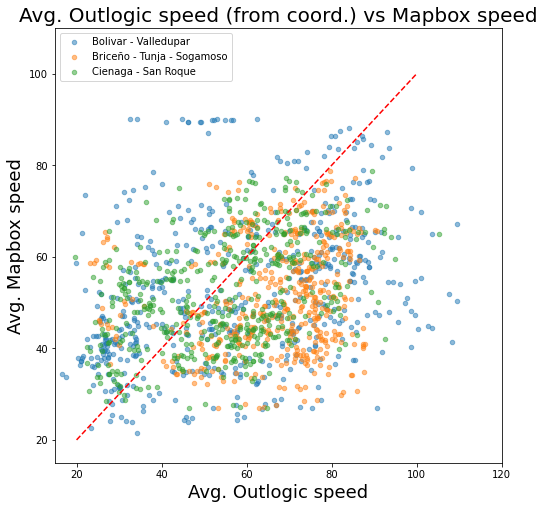

In [114]:
df_mean_speeds_id["ID_1"] = df_mean_speeds_id["ID_1"].astype(str)
df_dis["id_2"] = df_dis["id_2"].astype(str)

df_merge_id = df_mean_speeds_id.merge(df_dis, left_on = ["ID_1","hourTimeStamp"], right_on = ["id_2","hourTimeStamp"], how = "inner")

fig, ax = plt.subplots(figsize=(8,8))
for r in ["Bolivar_Valledupar","Briceno_Tunja_Sogamoso","Cienaga_San_Roque"]:
    df_merge_id_r = df_merge_id[df_merge_id["Road_right"] == r]
    xx = df_merge_id_r["speed_x"]
    yy = df_merge_id_r["speed_y"]
    ax.scatter(xx,yy, label = name[r], alpha = 0.5, s = 20)
    
xx = np.linspace(20,100)
ax.plot(xx,xx, c = 'r', ls = "--")     
plt.title("Avg. Outlogic speed (from coord.) vs Mapbox speed", fontsize = 20)
plt.xlabel("Avg. Outlogic speed", fontsize = 18)
plt.ylabel("Avg. Mapbox speed", fontsize = 18)
plt.ylim(15,110), plt.xlim(15,120)
plt.legend()
# plt.savefig("outputs/2022_11_informe/corr_from_coordinates_p85.png", dpi = 300)
plt.show()    

In [67]:
pearsonr(df_merge_id["speed_x"], df_merge_id["speed_y"])

PearsonRResult(statistic=0.28862848704275, pvalue=3.0973349224623524e-31)

In [52]:
stats.linregress(df_merge_id["speed_x"], df_merge_id["speed_y"])

LinregressResult(slope=0.20873259839283106, intercept=39.487706539401806, rvalue=0.3010845324482103, pvalue=5.728473849329901e-34, stderr=0.016770322329126196, intercept_stderr=1.0503496245519204)

In [115]:
# df_latlon = pd.read_csv("outputs/lotlan_road_hmean_std20dataday.csv")
df_latlon = df_mean_speeds_id.copy()
df_vel = pd.read_csv("outputs/2022_11_informe/df_merge_id_fromVel.csv")

In [5]:
df_latlon

,Road_right,ID_1,speed,speed_std
0,Bolivar_Valledupar,201,58.804044,30.128195
1,Bolivar_Valledupar,202,38.503740,3.417715
2,Bolivar_Valledupar,203,41.630424,12.603698
3,Bolivar_Valledupar,204,23.080048,NaN
4,Bolivar_Valledupar,205,73.320969,25.569234
...,...,...,...,...
290,Cienaga_San_Roque,98,64.359808,27.872354
291,Cienaga_San_Roque,99,36.328955,15.247489
292,Cienaga_San_Roque,100,57.802758,15.916967
293,Cienaga_San_Roque,101,38.877623,13.396137


In [80]:
# df_latlon = df_latlon.groupby(["Road_right","ID_1"]).agg(
#     speed = ("speed","mean")).reset_index()

# df_vel = df_vel.groupby(["Road_right","ID_1"]).agg(
#     speed = ("speed","mean")).reset_index()


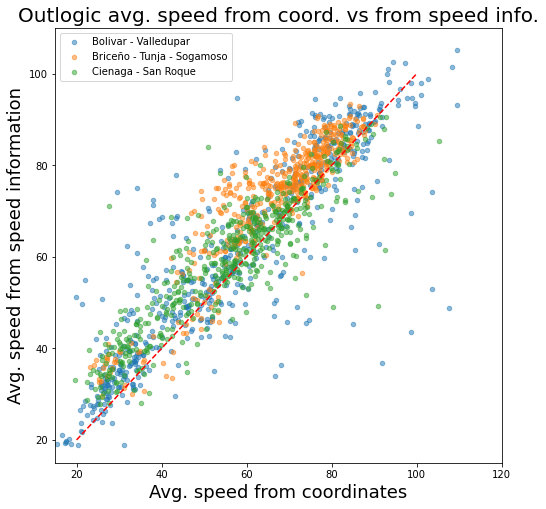

In [117]:
df_latlon["ID_1"] = df_latlon["ID_1"].astype(str)
df_vel["ID_1"] = df_vel["ID_1"].astype(str)

df_merge_latlon_vel = df_latlon.merge(df_vel, on = ["Road_right","ID_1","hourTimeStamp"], how = "inner")

# plot_corr_join(data = df_merge_latlon_vel, 
#                x = "speed_x", 
#                y = "speed_y",
#                hue = "Road_right")

# plt.xlabel("latlon")
# plt.ylabel("speed_analysis")
# plt.show()

fig, ax = plt.subplots(figsize=(8,8))
for r in ["Bolivar_Valledupar","Briceno_Tunja_Sogamoso","Cienaga_San_Roque"]:
    df_merge_id_r = df_merge_latlon_vel[df_merge_latlon_vel["Road_right"] == r]
    xx = df_merge_id_r["speed_x"]
    yy = df_merge_id_r["speed_y"]
    ax.scatter(xx,yy, label = name[r], alpha = 0.5, s = 20)
    
xx = np.linspace(20,100)
ax.plot(xx,xx, c = 'r', ls = "--")     
plt.title("Outlogic avg. speed from coord. vs from speed info.", fontsize = 20)
plt.xlabel("Avg. speed from coordinates", fontsize = 18)
plt.ylabel("Avg. speed from speed information", fontsize = 18)
plt.ylim(15,110), plt.xlim(15,120)
plt.legend()
plt.savefig("outputs/2022_11_informe/corr_from_speed_info_vs_coord_v2.png", dpi = 300)
plt.show()    

In [84]:
pearsonr(df_merge_latlon_vel["speed_x"], df_merge_latlon_vel["speed_y"])

PearsonRResult(statistic=0.8844179099198701, pvalue=0.0)

In [96]:
stats.linregress(df_merge_latlon_vel["speed_x"], df_merge_latlon_vel["speed_y"])

LinregressResult(slope=0.8323885050671045, intercept=10.455898053509493, rvalue=0.8927445814639374, pvalue=0.0, stderr=0.010562123430637638, intercept_stderr=0.6979907933728968)